In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("../Data/Raw Data/k2 Planets and Candidates.csv")

In [13]:
df

,rowid,pl_name,hostname,pl_letter,k2_name,epic_hostname,epic_candname,hd_name,hip_name,tic_id,...,releasedate,pl_nnotes,k2_campaigns,k2_campaigns_num,st_nphot,st_nrvc,st_nspec,pl_nespec,pl_ntranspec,pl_ndispec
0,1,BD+20 594 b,BD+20 594,b,K2-56 b,EPIC 210848071,EPIC 210848071.01,NaN,NaN,TIC 26123781,...,2018-02-15,1,4,1.0,0,0,0,0,0,0
1,2,BD+20 594 b,BD+20 594,b,K2-56 b,EPIC 210848071,EPIC 210848071.01,NaN,NaN,TIC 26123781,...,2016-07-28,1,4,1.0,0,0,0,0,0,0
2,3,BD+20 594 b,BD+20 594,b,K2-56 b,EPIC 210848071,EPIC 210848071.01,NaN,NaN,TIC 26123781,...,2018-04-26,1,4,1.0,0,0,0,0,0,0
3,4,EPIC 201111557.01,EPIC 201111557,NaN,NaN,EPIC 201111557,EPIC 201111557.01,NaN,NaN,TIC 176942156,...,2018-08-02,0,10,1.0,0,0,0,0,0,0
4,5,EPIC 201111557.01,EPIC 201111557,NaN,NaN,EPIC 201111557,EPIC 201111557.01,NaN,NaN,TIC 176942156,...,2018-02-15,0,10,1.0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3999,4000,WASP-85 A b,WASP-85 A,b,K2-94 b,EPIC 201862715,EPIC 201862715.01,NaN,NaN,TIC 380619414,...,2019-09-05,1,1,1.0,0,0,0,0,0,0
4000,4001,Wolf 503 b,Wolf 503,b,K2-262 b,EPIC 212779563,NaN,NaN,HIP 67285,TIC 187278212,...,2022-05-23,0,17,1.0,1,0,0,0,0,0
4001,4002,Wolf 503 b,Wolf 503,b,K2-262 b,EPIC 212779563,NaN,NaN,HIP 67285,TIC 187278212,...,2018-09-06,0,17,1.0,1,0,0,0,0,0
4002,4003,Wolf 503 b,Wolf 503,b,K2-262 b,EPIC 212779563,NaN,NaN,HIP 67285,TIC 187278212,...,2023-04-17,0,17,1.0,1,0,0,0,0,0


In [92]:
# Define the useful columns
useful_columns = [
    # Orbital properties
    "disposition","pl_orbper", "pl_orbsmax", "pl_orbeccen", "pl_orbincl", "pl_imppar",
    "pl_ratdor", "pl_ratror"
    
    # Planet size/mass/density
    "pl_rade", "pl_radj", "pl_masse", "pl_massj", "pl_bmasse", "pl_bmassj", "pl_dens",
    
    # Planet environment
    "pl_insol", "pl_eqt",
    
    # Transit details
    "pl_trandep", "pl_trandur", "pl_tranmid",
    
    # Stellar properties
    "st_teff", "st_rad", "st_mass", "st_met", "st_lum", "st_logg", "st_age", "st_dens",
    
    # Photometry
    "sy_vmag", "sy_bmag", "sy_gmag", "sy_rmag", "sy_imag", "sy_kepmag", "sy_tmag",
    
    # System properties
    "sy_snum", "sy_pnum", "sy_dist", "sy_pm", "sy_plx"
]

# Keep only the useful columns (if they exist in the dataset)
df_useful = df[[col for col in useful_columns if col in df.columns]]

# Save the cleaned dataset
df_useful.to_csv("K2_dataset_useful.csv", index=False)

print("✅ Cleaned dataset created with shape:", df_useful.shape)


✅ Cleaned dataset created with shape: (4004, 38)


In [98]:
df_useful["disposition"]

0       CONFIRMED
1       CONFIRMED
2       CONFIRMED
3       CANDIDATE
4       CANDIDATE
          ...    
3999    CONFIRMED
4000    CONFIRMED
4001    CONFIRMED
4002    CONFIRMED
4003    CONFIRMED
Name: disposition, Length: 4004, dtype: object

D:\Temp\ipykernel_15092\2063308738.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='disposition', data=df_useful, palette='viridis')


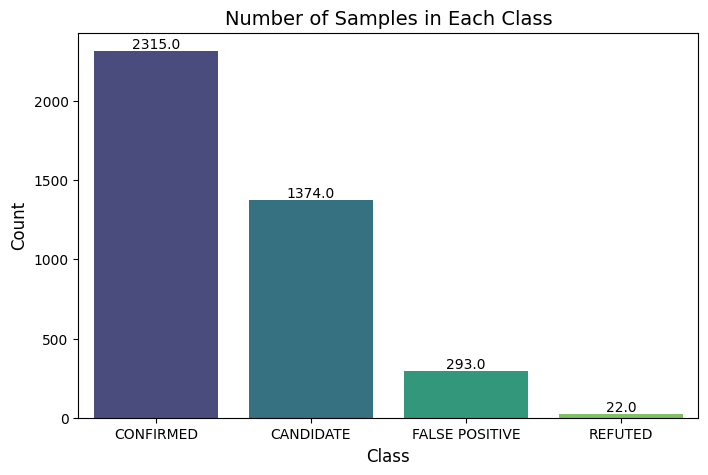

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your target column is 'disposition'
plt.figure(figsize=(8,5))
sns.countplot(x='disposition', data=df_useful, palette='viridis')
plt.title('Number of Samples in Each Class', fontsize=14)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12) 

# Annotate counts on top of bars
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=10)

plt.show()



In [ ]:
df_useful.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4004 entries, 0 to 4003
Data columns (total 38 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   disposition  4004 non-null   object 
 1   pl_orbper    3960 non-null   float64
 2   pl_orbsmax   820 non-null    float64
 3   pl_orbeccen  429 non-null    float64
 4   pl_orbincl   997 non-null    float64
 5   pl_imppar    1489 non-null   float64
 6   pl_ratdor    2197 non-null   float64
 7   pl_radj      3173 non-null   float64
 8   pl_masse     415 non-null    float64
 9   pl_massj     415 non-null    float64
 10  pl_bmasse    435 non-null    float64
 11  pl_bmassj    435 non-null    float64
 12  pl_dens      359 non-null    float64
 13  pl_insol     630 non-null    float64
 14  pl_eqt       854 non-null    float64
 15  pl_trandep   2099 non-null   float64
 16  pl_trandur   2783 non-null   float64
 17  pl_tranmid   3939 non-null   float64
 18  st_teff      2892 non-null   float64
 19  st_rad

In [19]:
df_useful.isnull().sum()

disposition       0
pl_orbper        44
pl_orbsmax     3184
pl_orbeccen    3575
pl_orbincl     3007
pl_imppar      2515
pl_ratdor      1807
pl_radj         831
pl_masse       3589
pl_massj       3589
pl_bmasse      3569
pl_bmassj      3569
pl_dens        3645
pl_insol       3374
pl_eqt         3150
pl_trandep     1905
pl_trandur     1221
pl_tranmid       65
st_teff        1112
st_rad          130
st_mass        1902
st_met         2306
st_lum         3231
st_logg        1648
st_age         3687
st_dens        3063
sy_vmag          42
sy_bmag         137
sy_gmag        2203
sy_rmag        2203
sy_imag        2203
sy_kepmag        15
sy_tmag           4
sy_snum           0
sy_pnum           0
sy_dist         125
sy_pm            41
sy_plx          247
dtype: int64

### Handling The Missing Values 

In [23]:
df_useful['pl_orbper'].isnull().sum()

44

In [29]:
df_useful['pl_orbper'].mean()

40.26011382302835

In [32]:
df_useful['pl_orbper'].fillna(df_useful['pl_orbper'].mean(),inplace=True)

D:\Temp\ipykernel_15092\2388152548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['pl_orbper'].fillna(df_useful['pl_orbper'].mean(),inplace=True)


In [33]:
df_useful['pl_orbper'].isnull().sum()

0

In [34]:
df_useful['pl_orbsmax']

0           NaN
1       0.24100
2           NaN
3           NaN
4           NaN
         ...   
3999        NaN
4000    0.05706
4001    0.05710
4002    0.05712
4003        NaN
Name: pl_orbsmax, Length: 4004, dtype: float64

In [ ]:
df_useful['pl_orbsmax'].fillna(df_useful['pl_orbsmax'].mean(),inplace=True) 

D:\Temp\ipykernel_15092\2479475691.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['pl_orbsmax'].fillna(df_useful['pl_orbsmax'].mean(),inplace=True)


In [36]:
df_useful['pl_orbsmax'].isnull().sum()

0

In [38]:
# 2. Numerical columns → fill with mean
numerical_cols = [
    'pl_orbper', 'pl_orbsmax', 'pl_orbeccen', 'pl_orbincl', 'pl_imppar', 
    'pl_ratdor', 'pl_radj', 'pl_masse', 'pl_massj', 'pl_bmasse', 'pl_bmassj', 
    'pl_dens', 'pl_insol', 'pl_eqt', 'pl_trandep', 'pl_trandur', 'pl_tranmid', 
    'st_teff', 'st_rad', 'st_mass', 'st_met', 'st_lum', 'st_logg', 'st_age', 
    'sy_pnum', 'sy_dist', 'sy_pm', 'sy_plx'
    # add other numeric columns if needed
]

for col in numerical_cols:
    df_useful[col].fillna(df_useful[col].mean(), inplace=True)

# -------------------------------
# Verify
# -------------------------------
print(df_useful.isnull().sum())

disposition       0
pl_orbper         0
pl_orbsmax        0
pl_orbeccen       0
pl_orbincl        0
pl_imppar         0
pl_ratdor         0
pl_radj           0
pl_masse          0
pl_massj          0
pl_bmasse         0
pl_bmassj         0
pl_dens           0
pl_insol          0
pl_eqt            0
pl_trandep        0
pl_trandur        0
pl_tranmid        0
st_teff           0
st_rad            0
st_mass           0
st_met            0
st_lum            0
st_logg           0
st_age            0
st_dens        3063
sy_vmag          42
sy_bmag         137
sy_gmag        2203
sy_rmag        2203
sy_imag        2203
sy_kepmag        15
sy_tmag           4
sy_snum           0
sy_pnum           0
sy_dist           0
sy_pm             0
sy_plx            0
dtype: int64


D:\Temp\ipykernel_15092\2618164061.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful[col].fillna(df_useful[col].mean(), inplace=True)
D:\Temp\ipykernel_15092\2618164061.py:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_useful[col].fillna(df_useful[col].mean(), inplace=True)


In [39]:
import seaborn as sns 

In [50]:
sns.pairplot(data=df_useful.drop('disposition',axis=1))

In [51]:
df_useful['disposition']

0       CONFIRMED
1       CONFIRMED
2       CONFIRMED
3       CANDIDATE
4       CANDIDATE
          ...    
3999    CONFIRMED
4000    CONFIRMED
4001    CONFIRMED
4002    CONFIRMED
4003    CONFIRMED
Name: disposition, Length: 4004, dtype: object

In [52]:
from sklearn.preprocessing import LabelEncoder

In [53]:
encoder = LabelEncoder()

In [54]:
df_useful['Encoded_Labels'] = encoder.fit_transform(df_useful['disposition'])

D:\Temp\ipykernel_15092\1637589926.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['Encoded_Labels'] = encoder.fit_transform(df_useful['disposition'])


In [55]:
df_useful

,disposition,pl_orbper,pl_orbsmax,pl_orbeccen,pl_orbincl,pl_imppar,pl_ratdor,pl_radj,pl_masse,pl_massj,...,sy_rmag,sy_imag,sy_kepmag,sy_tmag,sy_snum,sy_pnum,sy_dist,sy_pm,sy_plx,Encoded_Labels
0,CONFIRMED,41.688644,0.104828,0.120751,89.525540,0.438159,54.721028,0.210139,121.83621,0.383344,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
1,CONFIRMED,41.685500,0.241000,0.000000,89.550000,0.438159,55.800000,0.198947,16.30000,0.051285,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
2,CONFIRMED,41.685500,0.104828,0.000000,89.550000,0.438159,55.800000,0.230000,22.24810,0.070000,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
3,CANDIDATE,2.301830,0.104828,0.120751,87.601528,0.420000,11.800000,0.099900,121.83621,0.383344,...,NaN,NaN,11.363,10.7606,1,0,97.1795,73.413760,10.26160,0
4,CANDIDATE,2.302368,0.104828,0.120751,87.443840,0.438159,12.619867,0.120000,121.83621,0.383344,...,NaN,NaN,11.363,10.7606,1,0,97.1795,73.413760,10.26160,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3999,CONFIRMED,2.655676,0.104828,0.120751,87.601528,0.438159,7.834000,0.990000,121.83621,0.383344,...,NaN,NaN,10.247,10.1500,2,1,141.8870,78.021443,7.01970,1
4000,CONFIRMED,6.001270,0.057060,0.410000,87.601528,0.650000,22.451693,0.182265,6.26000,0.019696,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1
4001,CONFIRMED,6.001180,0.057100,0.120751,87.601528,0.387000,22.451693,0.181104,121.83621,0.383344,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1
4002,CONFIRMED,6.001270,0.057120,0.409000,89.870000,0.438159,22.451693,0.182265,6.27000,0.019728,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1


In [56]:
df_useful.drop('disposition',axis=1,inplace=True)

D:\Temp\ipykernel_15092\1072131197.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful.drop('disposition',axis=1,inplace=True)


In [57]:
df_useful

,pl_orbper,pl_orbsmax,pl_orbeccen,pl_orbincl,pl_imppar,pl_ratdor,pl_radj,pl_masse,pl_massj,pl_bmasse,...,sy_rmag,sy_imag,sy_kepmag,sy_tmag,sy_snum,sy_pnum,sy_dist,sy_pm,sy_plx,Encoded_Labels
0,41.688644,0.104828,0.120751,89.525540,0.438159,54.721028,0.210139,121.83621,0.383344,130.182165,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
1,41.685500,0.241000,0.000000,89.550000,0.438159,55.800000,0.198947,16.30000,0.051285,16.300000,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
2,41.685500,0.104828,0.000000,89.550000,0.438159,55.800000,0.230000,22.24810,0.070000,22.248100,...,NaN,NaN,11.040,10.4021,1,1,179.4610,63.053943,5.54366,1
3,2.301830,0.104828,0.120751,87.601528,0.420000,11.800000,0.099900,121.83621,0.383344,130.182165,...,NaN,NaN,11.363,10.7606,1,0,97.1795,73.413760,10.26160,0
4,2.302368,0.104828,0.120751,87.443840,0.438159,12.619867,0.120000,121.83621,0.383344,130.182165,...,NaN,NaN,11.363,10.7606,1,0,97.1795,73.413760,10.26160,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3999,2.655676,0.104828,0.120751,87.601528,0.438159,7.834000,0.990000,121.83621,0.383344,130.182165,...,NaN,NaN,10.247,10.1500,2,1,141.8870,78.021443,7.01970,1
4000,6.001270,0.057060,0.410000,87.601528,0.650000,22.451693,0.182265,6.26000,0.019696,6.260000,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1
4001,6.001180,0.057100,0.120751,87.601528,0.387000,22.451693,0.181104,121.83621,0.383344,130.182165,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1
4002,6.001270,0.057120,0.409000,89.870000,0.438159,22.451693,0.182265,6.27000,0.019728,6.270000,...,NaN,NaN,9.945,9.2493,1,1,44.5260,667.845078,22.43000,1


In [59]:
df_useful.to_csv("../Data/Clean Data/K2 P&C Clean.csv",index=False)

In [ ]:
df_useful.info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4004 entries, 0 to 4003
Data columns (total 38 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   pl_orbper       4004 non-null   float64
 1   pl_orbsmax      4004 non-null   float64
 2   pl_orbeccen     4004 non-null   float64
 3   pl_orbincl      4004 non-null   float64
 4   pl_imppar       4004 non-null   float64
 5   pl_ratdor       4004 non-null   float64
 6   pl_radj         4004 non-null   float64
 7   pl_masse        4004 non-null   float64
 8   pl_massj        4004 non-null   float64
 9   pl_bmasse       4004 non-null   float64
 10  pl_bmassj       4004 non-null   float64
 11  pl_dens         4004 non-null   float64
 12  pl_insol        4004 non-null   float64
 13  pl_eqt          4004 non-null   float64
 14  pl_trandep      4004 non-null   float64
 15  pl_trandur      4004 non-null   float64
 16  pl_tranmid      4004 non-null   float64
 17  st_teff         4004 non-null   f

In [70]:
df_useful.isnull().sum()

pl_orbper            0
pl_orbsmax           0
pl_orbeccen          0
pl_orbincl           0
pl_imppar            0
pl_ratdor            0
pl_radj              0
pl_masse             0
pl_massj             0
pl_bmasse            0
pl_bmassj            0
pl_dens              0
pl_insol             0
pl_eqt               0
pl_trandep           0
pl_trandur           0
pl_tranmid           0
st_teff              0
st_rad               0
st_mass              0
st_met               0
st_lum               0
st_logg              0
st_age               0
st_dens           3063
sy_vmag             42
sy_bmag            137
sy_gmag           2203
sy_rmag           2203
sy_imag           2203
sy_kepmag           15
sy_tmag              4
sy_snum              0
sy_pnum              0
sy_dist              0
sy_pm                0
sy_plx               0
Encoded_Labels       0
dtype: int64

In [71]:
df_useful['sy_vmag'].fillna(df_useful['sy_vmag'].mean(),inplace=True)

D:\Temp\ipykernel_15092\2180815694.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['sy_vmag'].fillna(df_useful['sy_vmag'].mean(),inplace=True)


In [72]:
df_useful.isnull().sum()

pl_orbper            0
pl_orbsmax           0
pl_orbeccen          0
pl_orbincl           0
pl_imppar            0
pl_ratdor            0
pl_radj              0
pl_masse             0
pl_massj             0
pl_bmasse            0
pl_bmassj            0
pl_dens              0
pl_insol             0
pl_eqt               0
pl_trandep           0
pl_trandur           0
pl_tranmid           0
st_teff              0
st_rad               0
st_mass              0
st_met               0
st_lum               0
st_logg              0
st_age               0
st_dens           3063
sy_vmag              0
sy_bmag            137
sy_gmag           2203
sy_rmag           2203
sy_imag           2203
sy_kepmag           15
sy_tmag              4
sy_snum              0
sy_pnum              0
sy_dist              0
sy_pm                0
sy_plx               0
Encoded_Labels       0
dtype: int64

In [73]:
df_useful['sy_bmag'].fillna(df_useful['sy_bmag'].mean(),inplace=True)

D:\Temp\ipykernel_15092\1961538891.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_useful['sy_bmag'].fillna(df_useful['sy_bmag'].mean(),inplace=True)
D:\Temp\ipykernel_15092\1961538891.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['sy_bmag'].fillna(df_useful['sy_bmag'].mean(),inplace=True)


In [74]:
df_useful.isnull().sum()

pl_orbper            0
pl_orbsmax           0
pl_orbeccen          0
pl_orbincl           0
pl_imppar            0
pl_ratdor            0
pl_radj              0
pl_masse             0
pl_massj             0
pl_bmasse            0
pl_bmassj            0
pl_dens              0
pl_insol             0
pl_eqt               0
pl_trandep           0
pl_trandur           0
pl_tranmid           0
st_teff              0
st_rad               0
st_mass              0
st_met               0
st_lum               0
st_logg              0
st_age               0
st_dens           3063
sy_vmag              0
sy_bmag              0
sy_gmag           2203
sy_rmag           2203
sy_imag           2203
sy_kepmag           15
sy_tmag              4
sy_snum              0
sy_pnum              0
sy_dist              0
sy_pm                0
sy_plx               0
Encoded_Labels       0
dtype: int64

In [75]:
df_useful['sy_kepmag'].fillna(df_useful['sy_kepmag'].mean(),inplace=True)

D:\Temp\ipykernel_15092\2043542084.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_useful['sy_kepmag'].fillna(df_useful['sy_kepmag'].mean(),inplace=True)
D:\Temp\ipykernel_15092\2043542084.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful['sy_kepmag'].fillna(df_useful['sy_kepmag'].mean(),inplace=True)


In [76]:
df_useful.isnull().sum()

pl_orbper            0
pl_orbsmax           0
pl_orbeccen          0
pl_orbincl           0
pl_imppar            0
pl_ratdor            0
pl_radj              0
pl_masse             0
pl_massj             0
pl_bmasse            0
pl_bmassj            0
pl_dens              0
pl_insol             0
pl_eqt               0
pl_trandep           0
pl_trandur           0
pl_tranmid           0
st_teff              0
st_rad               0
st_mass              0
st_met               0
st_lum               0
st_logg              0
st_age               0
st_dens           3063
sy_vmag              0
sy_bmag              0
sy_gmag           2203
sy_rmag           2203
sy_imag           2203
sy_kepmag            0
sy_tmag              4
sy_snum              0
sy_pnum              0
sy_dist              0
sy_pm                0
sy_plx               0
Encoded_Labels       0
dtype: int64

In [78]:
df_useful.drop(['st_dens','sy_gmag','sy_rmag','sy_imag'],axis=1,inplace=True)

D:\Temp\ipykernel_15092\1485220254.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_useful.drop(['st_dens','sy_gmag','sy_rmag','sy_imag'],axis=1,inplace=True)


In [79]:
df_useful.isnull().sum()

pl_orbper         0
pl_orbsmax        0
pl_orbeccen       0
pl_orbincl        0
pl_imppar         0
pl_ratdor         0
pl_radj           0
pl_masse          0
pl_massj          0
pl_bmasse         0
pl_bmassj         0
pl_dens           0
pl_insol          0
pl_eqt            0
pl_trandep        0
pl_trandur        0
pl_tranmid        0
st_teff           0
st_rad            0
st_mass           0
st_met            0
st_lum            0
st_logg           0
st_age            0
sy_vmag           0
sy_bmag           0
sy_kepmag         0
sy_tmag           4
sy_snum           0
sy_pnum           0
sy_dist           0
sy_pm             0
sy_plx            0
Encoded_Labels    0
dtype: int64

In [ ]:
df_useful.to_csv("../Data/Clean Data/K2 P&C Clean.csv",index=False)  

In [90]:
encoder.get_params()

{}